In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
import os

In [3]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Атаки с демонстрацией состязательных примеров (Adversarial examples)

In [4]:
import torch
from torch import autograd
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import vgg16, VGG
from torchvision import transforms
from scipy import ndimage
from PIL import Image as pil
import numpy as np
from tqdm import tqdm
import ast
import cv2

In [5]:
import matplotlib.pyplot as plt
plt.rcParams["axes.grid"] = False
plt.rcParams['figure.figsize'] = (20,10) # set default size of plots

In [6]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [7]:
model = vgg16(pretrained = True)
model = model.to(DEVICE)

In [8]:
burito = cv2.imread('burrito.jpg')
burito = cv2.cvtColor(burito, cv2.COLOR_BGR2RGB)

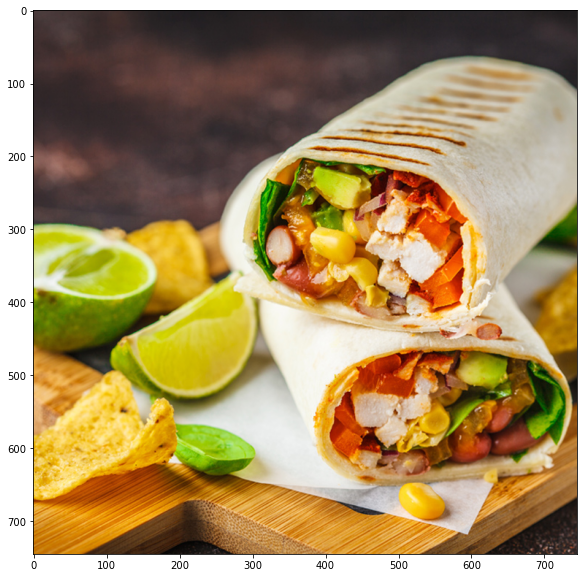

In [9]:
plt.imshow(burito)

In [10]:
lemur = cv2.imread('lemur.jpg')
lemur = cv2.cvtColor(lemur, cv2.COLOR_BGR2RGB)

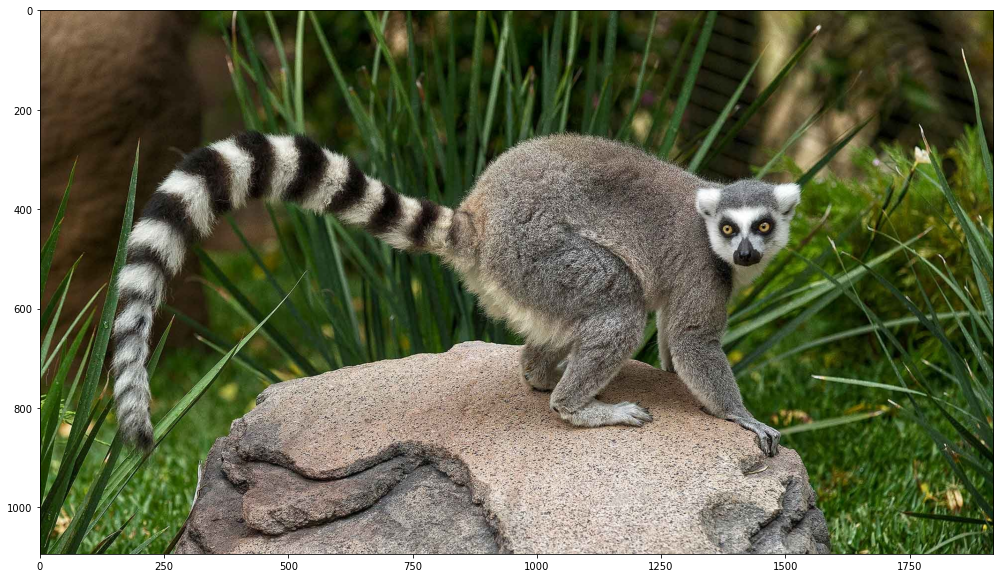

In [11]:
plt.imshow(lemur)

In [12]:
resized_lemur = cv2.resize(lemur, (224, 224))
resized_burito = cv2.resize(burito, (224, 224))

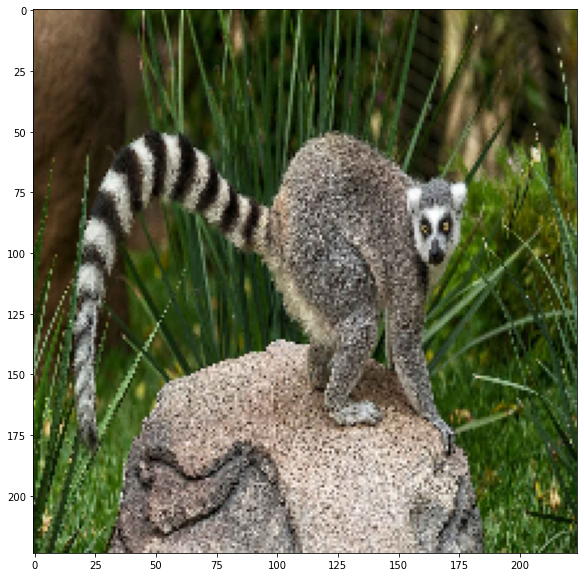

In [13]:
plt.imshow(resized_lemur)

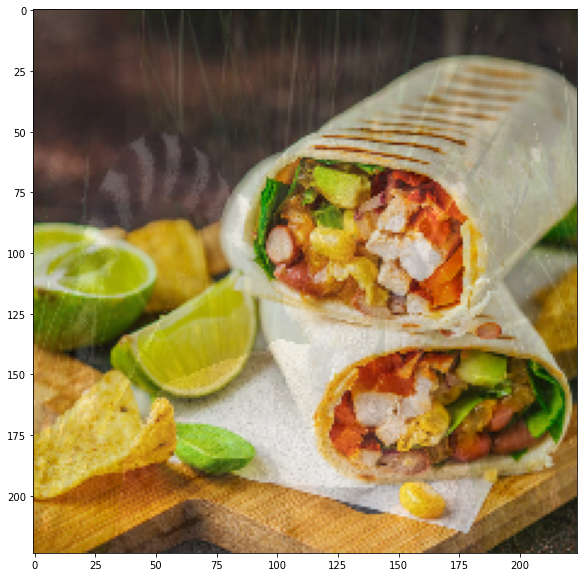

In [32]:
plt.imshow((0.8 *resized_burito + 0.2 * resized_lemur).astype(np.uint8))

In [15]:
class UnNormalize(transforms.Normalize):
    def __init__(self,mean,std,*args,**kwargs):
        new_mean = [-m/s for m,s in zip(mean,std)]
        new_std = [1/s for s in std]
        super().__init__(new_mean, new_std, *args, **kwargs)

In [16]:
normalize_imagenet = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                          std=[0.229, 0.224, 0.225])
normalize_imagenet_inv = UnNormalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

In [17]:
def ToTensor(img_np):
    img = img_np.astype(np.float32)/255.0
    img = np.transpose(img, (2,0,1))
    img = torch.Tensor(img).to(DEVICE)
    return img

In [18]:
def make_torch_tensor_imagenet_normalized(img_np_float):
    x = ToTensor(img_np_float)
    x = normalize_imagenet(x)
    x = torch.unsqueeze(x, 0)
    x = x.to(DEVICE)
    return x

In [19]:
def transform_back(img_tensor, dtype=np.uint8):
    x = torch.squeeze(img_tensor)
    x = normalize_imagenet_inv(x)
    x = x.detach().cpu().numpy()
    x = np.transpose(x, (1,2,0))
    x = (255*(x-x.min())/(x.max()-x.min())).astype(dtype)
    return x

In [20]:
with open("imagenet_class_index.json", "r") as file:
    contents = file.read()
    imagenet_labels = ast.literal_eval(contents)

In [21]:
def imagenet_id2class(cid):
    return imagenet_labels[str(cid)][1]

In [53]:
def decode_predictions(y, top=5):
    if ((type(y) is torch.Tensor) or (type(y) is torch.cuda.Tensor)):
        y = np.squeeze(y.detach().cpu().numpy())
    y_enumerated = [(cid,p) for cid,p in zip(range(1000), y)]
    y_enumerated_sorted = sorted(y_enumerated, key=lambda x:x[1], reverse=True)
    ret = [(cid, imagenet_labels[str(cid)][1], p) for cid,p in y_enumerated_sorted[:top]]
    return ret

In [23]:
[(cid,imagenet_id2class(cid)) for cid in range(1000) if 'Madagascar_cat' in imagenet_id2class(cid)]

[(383, 'Madagascar_cat')]

In [24]:
[(cid,imagenet_id2class(cid)) for cid in range(1000) if 'burrito' in imagenet_id2class(cid)]

[(965, 'burrito')]

### Что скажет VGG16 на смешанное изображение?

In [33]:
mixed_image = (0.8 *resized_burito + 0.2 * resized_lemur).astype(np.uint8)

In [34]:
y = model(make_torch_tensor_imagenet_normalized(mixed_image))

In [35]:
decode_predictions(y, top=10)

[(965, 'burrito'),
 (934, 'hotdog'),
 (924, 'guacamole'),
 (987, 'corn'),
 (930, 'French_loaf'),
 (923, 'plate'),
 (943, 'cucumber'),
 (998, 'ear'),
 (939, 'zucchini'),
 (947, 'mushroom')]

### Вывод:
Состязательный пример, полученный простой взвешенной суммой двух изображений, уже может снизить качество классификации

In [36]:
lemur = cv2.resize(lemur, (480, 274))

### Попробуем сделать из лемура буррито без линейного смешивания.

In [37]:
img = make_torch_tensor_imagenet_normalized(lemur)

In [38]:
y = model(img)

In [39]:
decode_predictions(y)

[(383, 'Madagascar_cat'),
 (384, 'indri'),
 (298, 'mongoose'),
 (380, 'titi'),
 (377, 'marmoset')]

In [40]:
epsilon = 10
below = np.clip(transform_back(img, np.float32) - epsilon, 0, 255)
# below = make_torch_tensor_imagenet_normalized(below)
above = np.clip(transform_back(img, np.float32) + epsilon, 0, 255)
# above = make_torch_tensor_imagenet_normalized(above)

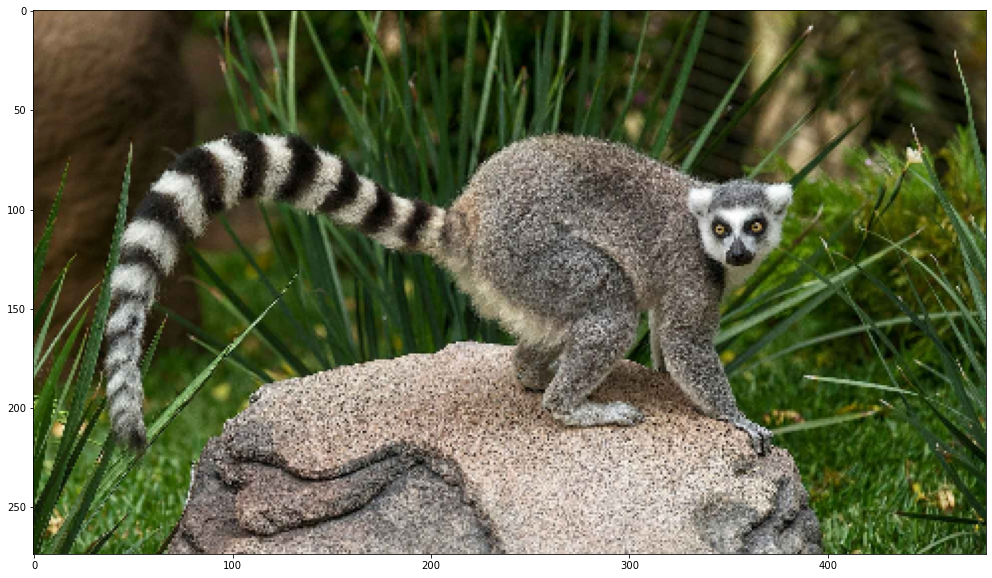

In [41]:
plt.imshow(transform_back(img))

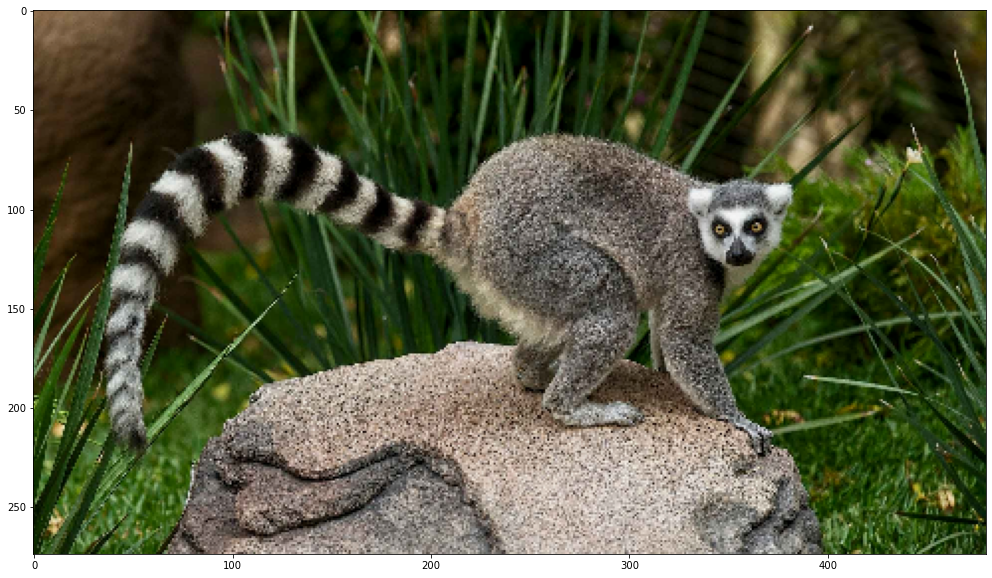

In [42]:
plt.imshow(below.astype(np.uint8))

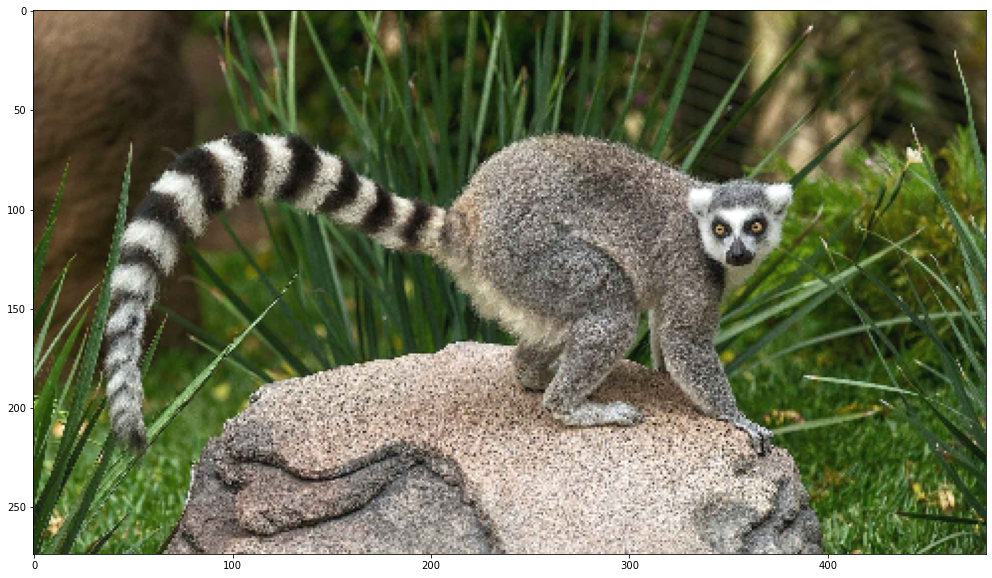

In [43]:
plt.imshow(above.astype(np.uint8))

In [44]:
layer_num = -1
target_feature_num = 965
suppressing_feature_num = 383

In [45]:
sm = torch.nn.Softmax(dim=-1)

In [46]:
# Вариант для карт активации ранга 2 - вектор выходных значений оценки вероятности классов
steps = 1000
lr = 0.1
f383_objective_history = []
f965_objective_history = []


with tqdm(total=steps, ncols=120, disable=False) as pbar:
    for i in range(steps):
        img = img.requires_grad_(True)
        
        y2opt = sm(model(img))
        
        f965 = y2opt[0,target_feature_num]
        f383 = y2opt[0,suppressing_feature_num]
        
        f965_np = float(f965.detach().cpu().numpy())
        f383_np = float(f383.detach().cpu().numpy())
        f383_objective_history.append(f383_np)
        f965_objective_history.append(f965_np)
        
        loss = torch.log(y2opt + 1e-8)[:,target_feature_num]
        loss.backward()
        img = img + lr*img.grad
        
        img_np = transform_back(img, np.float32)
        img_np_clipped = np.clip(img_np, below, above)
        img = ToTensor(img_np_clipped)
        img = normalize_imagenet(img)
        img = torch.unsqueeze(img, 0)
        img = img.to(DEVICE)
        
        img.grad = None
        pbar.update(1)
        pbar.set_postfix({'step': i, 'f965': '%e'%f965_np, 'f383': '%e'%f383_np})
        
        if f965_np >= 0.97:
            break

 12%|████                            | 125/1000 [00:03<00:22, 39.20it/s, step=124, f965=9.849000e-01, f383=9.149780e-07]


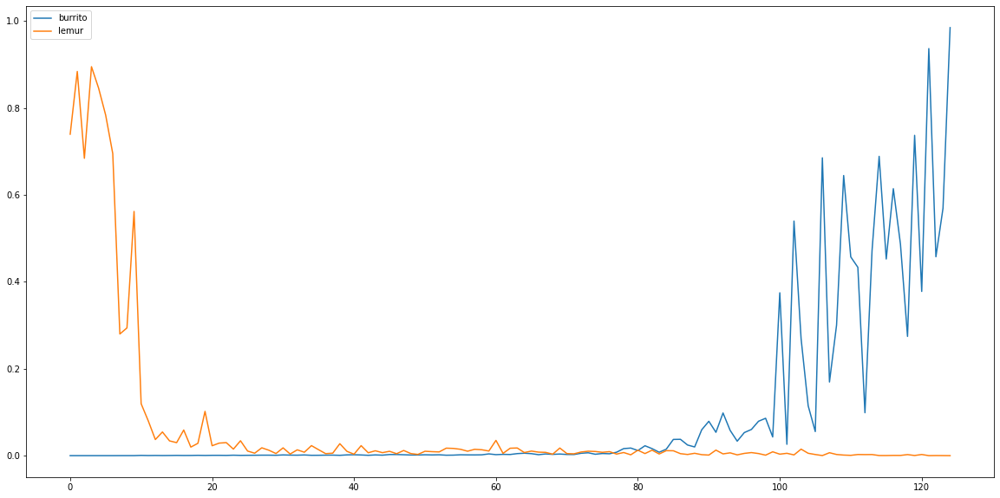

In [47]:
plt.plot(f965_objective_history, label='burrito')
plt.plot(f383_objective_history, label='lemur')
_ = plt.legend()

In [48]:
img_np = transform_back(img)

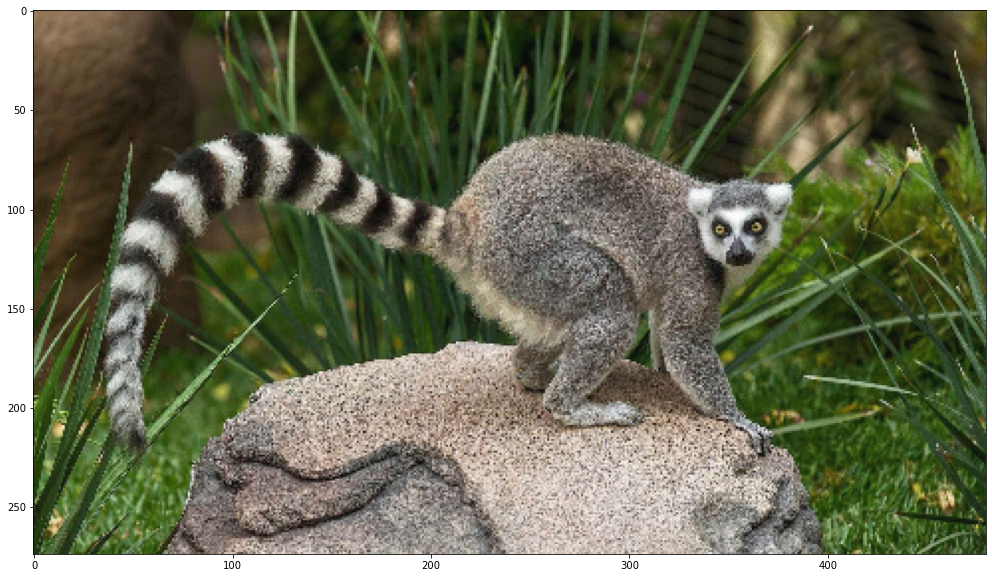

In [49]:
plt.imshow(img_np)

In [55]:
y = sm(model(img))

In [56]:
decode_predictions(y, top=10)

[(965, 'burrito', 0.75992966),
 (105, 'koala', 0.023450648),
 (265, 'toy_poodle', 0.015583861),
 (434, 'bath_towel', 0.013735086),
 (164, 'bluetick', 0.007094332),
 (850, 'teddy', 0.0068346784),
 (178, 'Weimaraner', 0.005985458),
 (171, 'Italian_greyhound', 0.0058222553),
 (997, 'bolete', 0.0039618416),
 (6, 'stingray', 0.0039147325)]

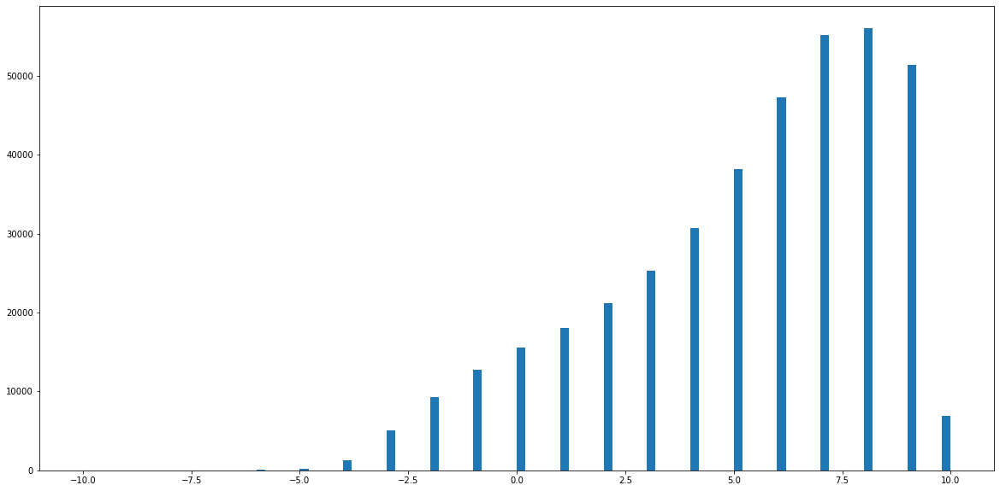

In [57]:
plt.hist((img_np.astype(np.float32) - lemur.astype(np.float32)).ravel(), bins=100);

In [58]:
dev = (img_np.astype(np.float32) - lemur.astype(np.float32))

In [59]:
dev_normed = (dev-dev.min())/(dev.max()-dev.min())

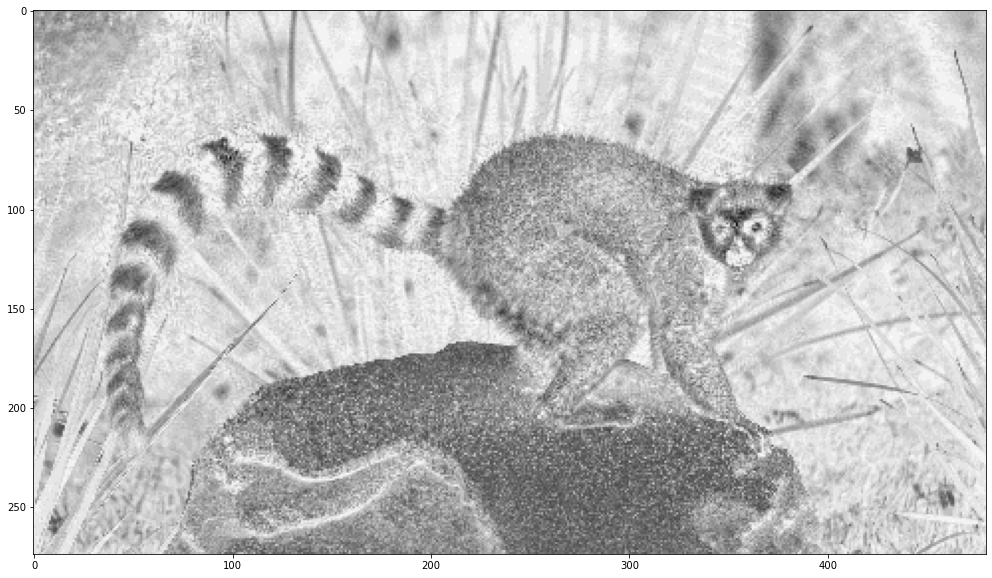

In [61]:
plt.imshow(dev_normed[:,:,0], cmap='gray')

ОК! А что будет если картинку повернуть?

In [62]:
lemur_burrito = np.copy(img_np)

In [63]:
def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result

In [64]:
lemur_burrito_rot = rotate_image(lemur_burrito, 15)

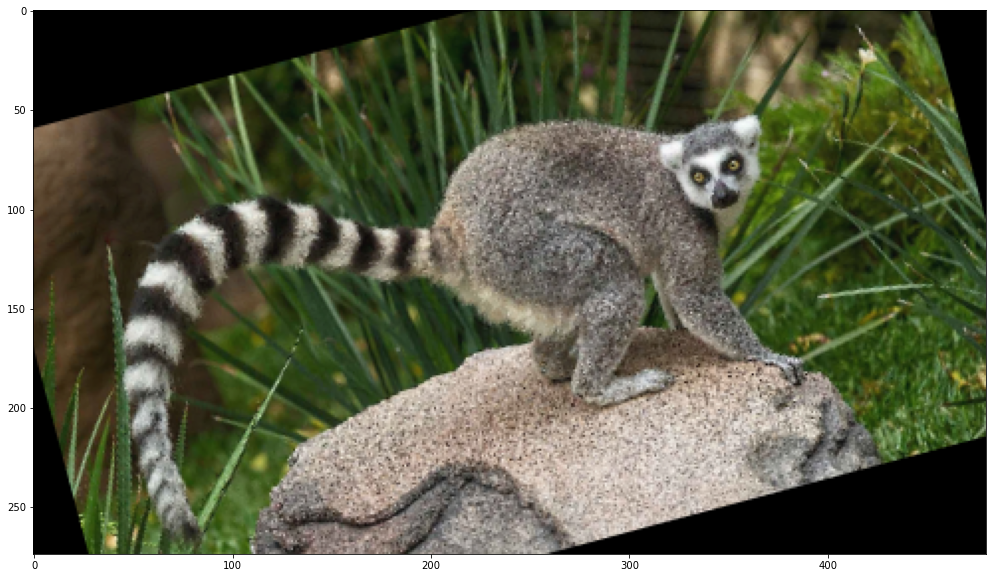

In [65]:
plt.imshow(lemur_burrito_rot)

In [66]:
img_rot = make_torch_tensor_imagenet_normalized(lemur_burrito_rot)

In [67]:
y_rot = sm(model(img_rot))

In [68]:
decode_predictions(y_rot)

[(383, 'Madagascar_cat', 0.85797185),
 (384, 'indri', 0.07627129),
 (105, 'koala', 0.006267685),
 (289, 'snow_leopard', 0.0047300844),
 (285, 'Egyptian_cat', 0.0030301886)]

Интересно! Стоило только повернуть изображение - и это снова лемур!

In [69]:
def get_rot_mat(theta):
    theta = torch.tensor(theta)
    return torch.tensor([[torch.cos(theta), -torch.sin(theta), 0],
                         [torch.sin(theta), torch.cos(theta), 0]])

In [70]:
def rot_img(x, theta, dtype=torch.cuda.FloatTensor):
    rot_mat = get_rot_mat(theta)[None, ...].type(dtype).repeat(x.shape[0],1,1)
    grid = F.affine_grid(rot_mat, x.size()).type(dtype)
    x = F.grid_sample(x, grid)
    return x

## ОК! Ну тогда давайте оптимизируем класс Буррито с аугментациями.

In [71]:
img = make_torch_tensor_imagenet_normalized(lemur)

In [72]:
epsilon = 20
below = np.clip(transform_back(img, np.float32) - epsilon, 0, 255)
above = np.clip(transform_back(img, np.float32) + epsilon, 0, 255)

In [73]:
dtype =  torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

In [74]:
# Вариант для карт активации ранга 2 - вектор выходных значений оценки вероятности классов
steps = 1000
examples = 32
lr = 0.01
f383_objective_history = []
f965_objective_history = []


with tqdm(total=steps, ncols=120, disable=False) as pbar:
    for i in range(steps):
        img = img.requires_grad_(True)
        
        f965_np = 0
        f383_np = 0
        loss = 0.0
        
        batch = []
        for i in range(examples):
            angle = (np.random.rand()-0.5)*30
            angle = np.pi*(angle/180.0)
            rotated_im = rot_img(img, angle, dtype)
            batch.append(rotated_im)
        
        batch = torch.cat(batch, 0)
        y2opt = sm(model(batch))
        
        f965 = y2opt[:,target_feature_num]
        f383 = y2opt[:,suppressing_feature_num]
        f965_np = float(f965.detach().cpu().numpy().mean())
        f383_np = float(f383.detach().cpu().numpy().mean())
            
        loss = torch.mean(torch.log(y2opt + 1e-8)[:,target_feature_num])
        
        f383_objective_history.append(f383_np)
        f965_objective_history.append(f965_np)
        
        loss.backward()
        img = img + lr*(img.grad/(img.grad.std()+1e-8))
        
        img_np = transform_back(img, np.float32)
        img_np_clipped = np.clip(img_np, below, above)
        img = ToTensor(img_np_clipped)
        img = normalize_imagenet(img)
        img = torch.unsqueeze(img, 0)
        img = img.to(DEVICE)
        
        img.grad = None
        pbar.update(1)
        pbar.set_postfix({'step': i, 'f965': '%e'%f965_np, 'f383': '%e'%f383_np})
        
        if f965_np >= 0.7:
            break

  0%|                                                                                          | 0/1000 [00:00<?, ?it/s]/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:3447: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
/opt/conda/lib/python3.6/site-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
  2%|▌                                 | 15/1000 [00:08<08:55,  1.84it/s, step=31, f965=9.258588e-01, f383=2.981409e-04]


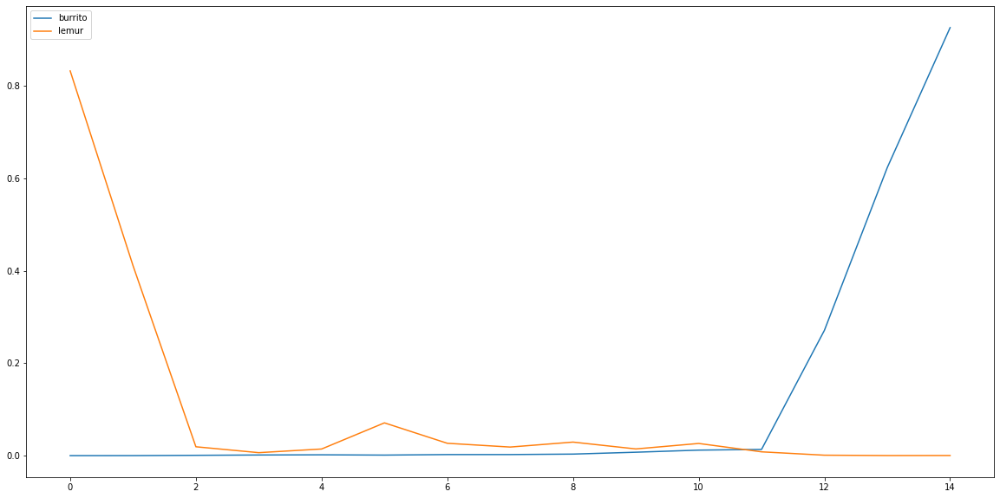

In [75]:
plt.plot(f965_objective_history, label='burrito')
plt.plot(f383_objective_history, label='lemur')
_ = plt.legend()

In [76]:
img_np = transform_back(img)

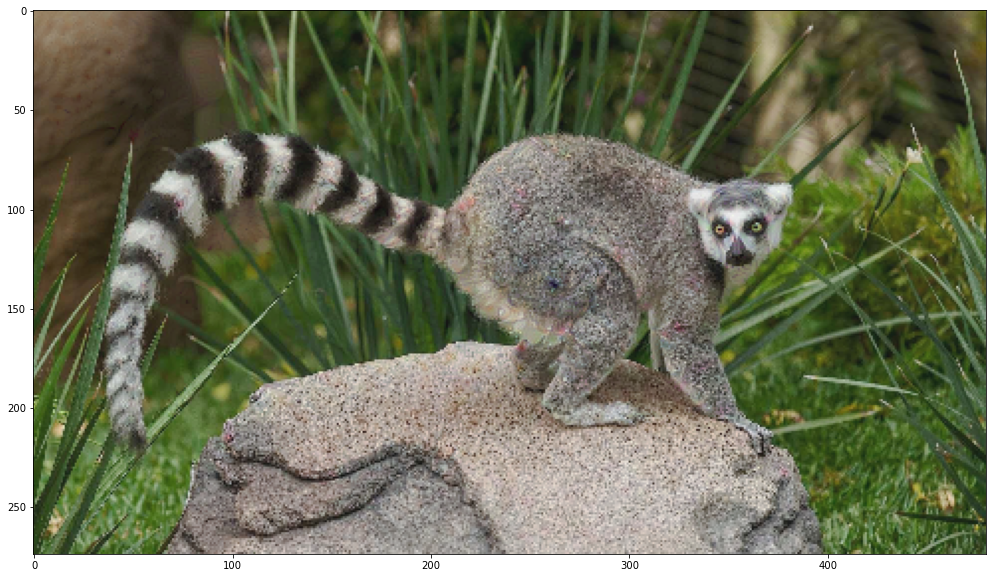

In [77]:
plt.imshow(img_np)

In [80]:
y = sm(model(img))

In [81]:
decode_predictions(y, top=10)

[(965, 'burrito', 0.9997048),
 (397, 'puffer', 0.00013083324),
 (105, 'koala', 3.1023414e-05),
 (963, 'pizza', 2.5694013e-05),
 (937, 'broccoli', 1.8680747e-05),
 (924, 'guacamole', 1.7816794e-05),
 (125, 'hermit_crab', 8.485649e-06),
 (112, 'conch', 5.5275286e-06),
 (338, 'guinea_pig', 5.4751067e-06),
 (333, 'hamster', 4.4990766e-06)]

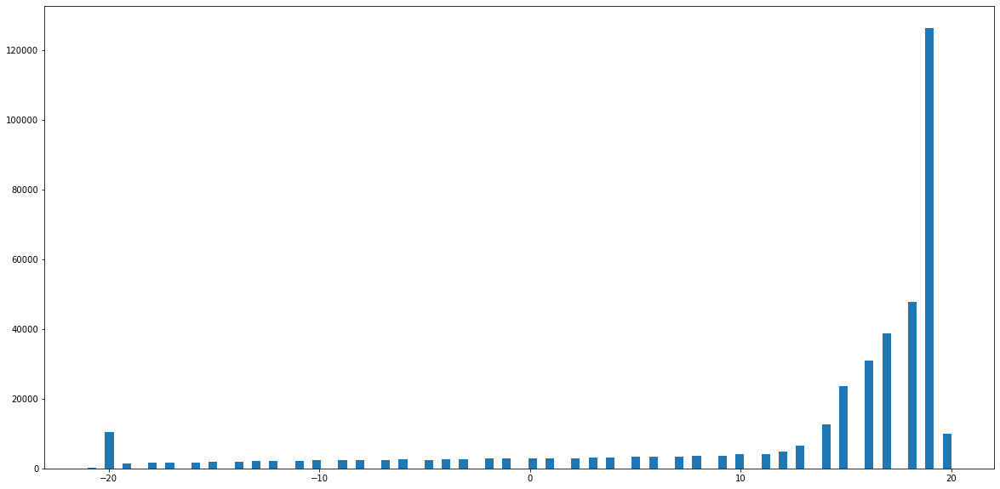

In [82]:
plt.hist((img_np.astype(np.float32) - lemur.astype(np.float32)).ravel(), bins=100);

In [83]:
dev = (img_np.astype(np.float32) - lemur.astype(np.float32))

In [84]:
dev_normed = (dev-dev.min())/(dev.max()-dev.min())

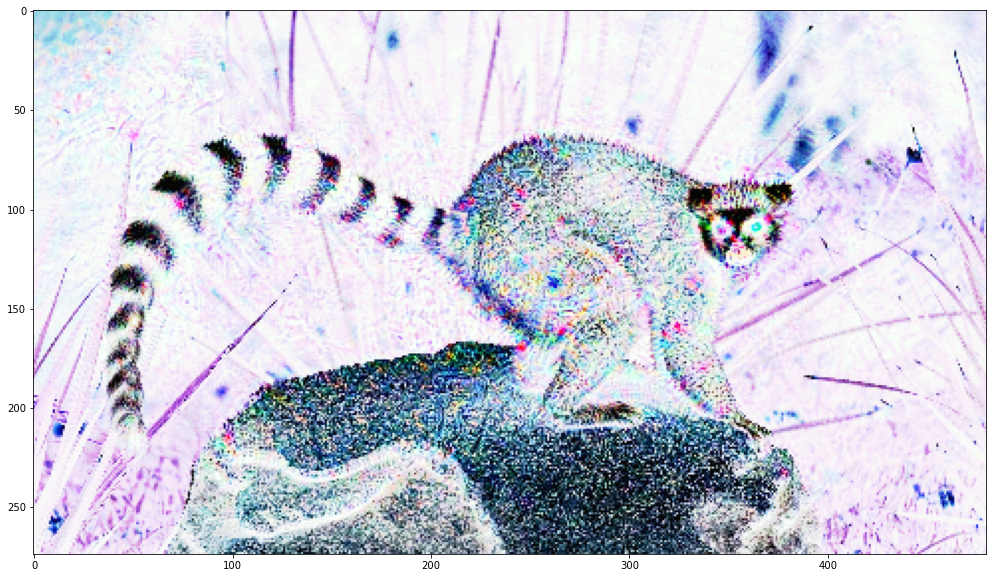

In [85]:
plt.imshow(dev_normed)

Ну что, повернем картинку снова

In [86]:
lemur_burrito = np.copy(img_np)

In [87]:
lemur_burrito_rot = rotate_image(lemur_burrito, 10)

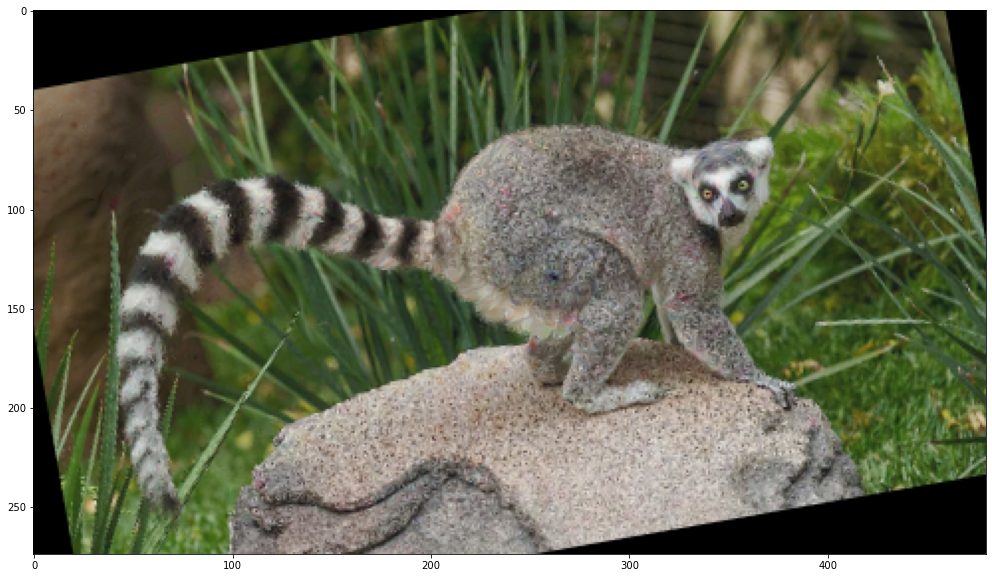

In [88]:
plt.imshow(lemur_burrito_rot)

In [89]:
img_rot = make_torch_tensor_imagenet_normalized(lemur_burrito_rot)

In [92]:
y_rot = sm(model(img_rot))

In [93]:
decode_predictions(y_rot)

[(965, 'burrito', 0.9212316),
 (94, 'hummingbird', 0.020709021),
 (397, 'puffer', 0.013410949),
 (105, 'koala', 0.004143139),
 (338, 'guinea_pig', 0.0025752436)]

# ВЫВОДЫ

### (1) У глубоких свёрточных нейронных сетей - свои "иллюзии". (Не только свёрточных. Не только глубоких.)
### (2) Эти иллюзии можно эксплуатировать, если иметь доступ к архитектуре модели и ее весам
### (3a) Ландшафт функции потерь в **пространстве признаков**, видимо, выглядит очень не гладко, если судить по тому, что небольшое прицельное искажение объекта без потери семантического содержания может сильно поменять вывод модели (=> значение ф-ии потерь).
### (3b) Модели, предварительно обученные на данных ImageNet, могут быть чувствительны к незначительным вариациям входных данных. Здесь показана сильная чувствительность к **прицельным** вариациям, но они могут быть и случайными, порожденными самим процессом, порождающим данные.
### (5) Если нужна модель, устойчивая к такого рода атакам, - нужно обучать ее с аугментацией данных.
### (6) Состязательная атака - искусство, в котором необходимо подбирать гиперпараметры, схему оптимизации и проч.